## Trial-1

1. Try mean of channels
    - statistical informations of whole image or of small patches
2. GLCM
    - Small matrix size (4/5 bits instead of 8)
    - Small distance (1 or 2)
    - Statistical informations of whole image or of small patches (Target is taking a local feature or texture if prior idea of spatial information

3. LBP
    - Small radius (1, 2)
    - Neighbours (8, 12, 16)
    - statistical informations of whole image or of small patches
    - - Statistical informations of whole image or of small patches (Target is taking a local feature or texture if prior idea of spatial information
    


## Trial-2 

1. Moments
    - Area can be calculated of a binary image using m(0,0) momentum
    - Center of an object can be calculated. x = m(1,0)/m(0,0), y = m(0,1)/m(0,0)
2. Salient Key Points
    - PDM (Point Distribution Model / Statistical Shape Model
    - SIFT and SURF

----------------------------------------------------
----------------------------------------------------
----------------------------------------------------

# Importing necessary libaries

In [76]:
!pip install mahotas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 52.6 MB/s eta 0:00:0000:0100:01


In [77]:
import cv2 as cv
import os
import pandas as pd
import random
import matplotlib.pyplot as plt
import numpy as np 
from skimage import segmentation
from skimage.feature import local_binary_pattern
from skimage.feature import graycomatrix, graycoprops
import mahotas

# Data import and unzipping

In [3]:
# Define classes and the directory where files were extracted
classes = ['nevus', 'others']
image_dir_train = '/kaggle/input/skin-cancer-detecttion/dataset/train'

# Initialize an empty list to store image file paths and their corresponding labels
data = []

# Loop through each class folder and each image within that folder
for c in classes:
    class_dir = os.path.join(image_dir_train, c)
    
    if os.path.exists(class_dir):
        for filename in os.listdir(class_dir):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filter image files
                image_path = os.path.join(class_dir, filename)
                data.append([image_path, c])  # Append image path and its label (class)

# Create a pandas DataFrame from the data
df_train = pd.DataFrame(data, columns=['image_path', 'label'])

In [4]:
# Display the first few rows of the DataFrame
df_train.shape

(15195, 2)

In [5]:
image_dir_valid = '/kaggle/input/skin-cancer-detecttion/dataset/val'

# Initialize an empty list to store image file paths and their corresponding labels
data = []

# Loop through each class folder and each image within that folder
for c in classes:
    class_dir = os.path.join(image_dir_valid, c)
    
    if os.path.exists(class_dir):
        for filename in os.listdir(class_dir):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Filter image files
                image_path = os.path.join(class_dir, filename)
                data.append([image_path, c])  # Append image path and its label (class)

# Create a pandas DataFrame from the data
df_valid = pd.DataFrame(data, columns=['image_path', 'label'])

In [6]:
# Display the first few rows of the DataFrame
df_valid.shape

(3796, 2)

# Random Image Visualization

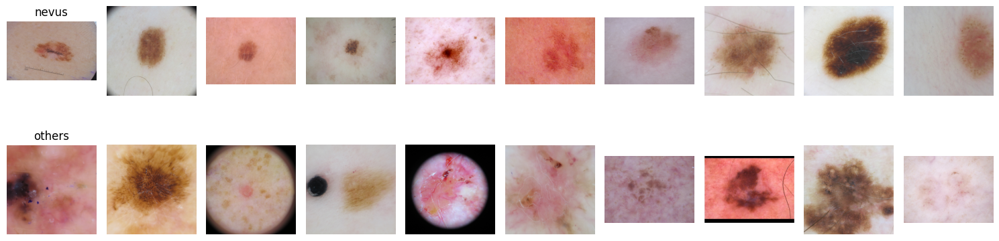

In [65]:
# Number of random images to select per class
num_images = 10

# Initialize a dictionary to store selected image paths by class
selected_images = {}

# Loop through each class and randomly sample 10 images
for c in df_train['label'].unique():
    class_images = df_train[df_train['label'] == c]  # Filter DataFrame by class
    sampled_images = class_images.sample(n=min(len(class_images), num_images))  # Randomly sample 10 images
    selected_images[c] = sampled_images['image_path'].tolist()

# Plot the randomly selected images
fig, axes = plt.subplots(len(selected_images), num_images, figsize=(15, 5))

for class_idx, c in enumerate(selected_images.keys()):
    for img_idx, img_path in enumerate(selected_images[c]):
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
        ax = axes[class_idx, img_idx]
        ax.imshow(img_rgb)
        ax.axis('off')  # Hide axis for cleaner display
        if img_idx == 0:
            ax.set_title(c)  # Set class label as title on the first image of each row

plt.tight_layout()
plt.show()

In [8]:
selected_images

{'nevus': ['/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev01157.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev06226.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev05931.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev00732.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev00390.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev06626.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev01557.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev04879.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev05664.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/nevus/nev00935.jpg'],
 'others': ['/kaggle/input/skin-cancer-detecttion/dataset/train/others/bcc00301.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/others/bkl00605.jpg',
  '/kaggle/input/skin-cancer-detecttion/dataset/train/others/ack00151.jpg',
  

# Preprocesing Trials

Here we will trial different preprocessing techniques and see their output

In [ ]:
# def _roi(self, img, threshold=50):
#         """
#         Extract the region of interest (ROI) from the image based on a 2D analysis of pixel intensity values.

#         Parameters:
#             img (numpy.ndarray): Input image.
#             threshold (int): Threshold value to determine the cropping boundaries.

#         Returns:
#             numpy.ndarray: Cropped image containing the ROI.
#         """
#         # Convert the image to grayscale to simplify intensity calculations
#         gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#         # Calculate mean values along rows and columns
#         row_means = np.mean(gray, axis=1)
#         col_means = np.mean(gray, axis=0)

#         # Find the start and end points where the mean value exceeds the threshold for rows and columns
#         y_above_threshold = np.where(row_means >= threshold)[0]
#         x_above_threshold = np.where(col_means >= threshold)[0]

#         # If no values exceed the threshold, return the original image
#         if y_above_threshold.size == 0 or x_above_threshold.size == 0:
#             return img

#         # Determine the cropping boundaries based on the threshold-crossing points
#         y1, y2 = y_above_threshold[0], y_above_threshold[-1]
#         x1, x2 = x_above_threshold[0], x_above_threshold[-1]

#         # Add padding to preserve context around the region of interest
#         padding = 10  # You can adjust this value
#         y1 = max(0, y1 - padding)
#         y2 = min(img.shape[0], y2 + padding)
#         x1 = max(0, x1 - padding)
#         x2 = min(img.shape[1], x2 + padding)

#         # Crop the image using the calculated coordinates
#         img_new = img[y1:y2, x1:x2, :]

#         # Ensure the cropped image is not empty
#         if img_new.shape[0] == 0 or img_new.shape[1] == 0:
#             return img

#         return img_new

In [72]:
# Preprocessing Class
class Preprocessing:
    """
       Preprocessing class. This class's purpose is to preprocess the images in the dataset.
    """

    def _hair_removal(self, img, se_width=11, se_height=1, n_orientations=8):
        # Input validation for structuring element dimensions
        if se_width % 2 == 0:
            raise ValueError(f"Structuring element width ({se_width}) must be odd")
        if se_height % 2 == 0:
            raise ValueError(f"Structuring element height ({se_height}) must be odd")

        # Convert the original image to grayscale if it has more than 1 channel
        if len(img.shape) == 3:
            img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        else:
            img_gray = img

        # Create tilted structuring elements
        base = np.zeros((se_width, se_width), dtype=np.uint8)
        for k in range(se_width // 2 - se_height // 2, se_width // 2 + se_height // 2 + 1):
            cv.line(base, (0, k), (se_width, k), 255)

        # Compute rotated structuring elements
        SEs = [base]
        angle_step = 180.0 / n_orientations
        for k in range(1, n_orientations):
            rotation_matrix = cv.getRotationMatrix2D((se_width / 2.0, se_width / 2.0), k * angle_step, 1.0)
            SE = cv.warpAffine(base, rotation_matrix, (se_width, se_width), flags=cv.INTER_NEAREST)
            SEs.append(SE)

        # Initialize sum of blackhat results
        sum_blackhats = np.zeros_like(img_gray, dtype=np.uint16)

        # Apply blackhat operation using each structuring element and accumulate results
        for SE in SEs:
            blackhat = cv.morphologyEx(img_gray, cv.MORPH_BLACKHAT, SE)
            sum_blackhats += blackhat

        # Normalize the sum of blackhats to the range 0-255 and convert to uint8
        cv.normalize(sum_blackhats, sum_blackhats, 0, 255, cv.NORM_MINMAX)
        sum_blackhats = sum_blackhats.astype(np.uint8)

        # Threshold the blackhat sum to create a binary mask for inpainting
        _, thresholded = cv.threshold(sum_blackhats, 0, 255, cv.THRESH_BINARY | cv.THRESH_TRIANGLE)

        # Refine the mask using morphological opening to remove small components
        thresholded = cv.morphologyEx(thresholded, cv.MORPH_OPEN, cv.getStructuringElement(cv.MORPH_ELLIPSE, (3, 3)))

        # Dilate the mask slightly to cover the hair regions more effectively
        thresholded = cv.dilate(thresholded, cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5)))

        # Inpaint the original image using the created mask
        if len(img.shape) == 3:
            result = cv.inpaint(img, thresholded, 3, cv.INPAINT_NS)
        else:
            result = cv.inpaint(img_gray, thresholded, 3, cv.INPAINT_NS)

        return result
    
    def _color_constancy(self, img, power=5, gamma=1.4):
        """
        Apply color constancy to the input image using a power transformation and optional gamma correction.

        Parameters:
            img (numpy.ndarray): Input image.
            power (float): Power to use for the power transformation (default is 6).
            gamma (float, optional): Gamma value for gamma correction (default is 2.2).

        Returns:
            numpy.ndarray: Image with color constancy applied.
        """
        # Get the data type of the input image
        img_dtype = img.dtype

        # Apply gamma correction if gamma is provided
        if gamma is not None:
            img = img / 255.0  # Normalize to 0-1
            img = np.power(img, 1 / gamma)
            img = (img * 255).astype('float32')

        # Convert the image to float32 data type for further processing
        img = img.astype('float32')

        # Apply power transformation to the image
        img_power = np.power(img, power)

        # Calculate the mean of img_power along channels (0 and 1)
        rgb_vec = np.power(np.mean(img_power, axis=(0, 1)), 1 / power)

        # Calculate the L2 norm of rgb_vec
        rgb_norm = np.linalg.norm(rgb_vec)

        # Normalize rgb_vec to have unit length
        rgb_vec /= (rgb_norm + 1e-6)  # Added small value to avoid division by zero

        # Scale down rgb_vec to prevent overexposure (tuning parameter)
        scale_factor = 0.8  # Scale down the effect of rgb_vec
        rgb_vec = (1 / (rgb_vec * np.sqrt(3))) * scale_factor

        # Scale img using the adjusted color constancy vector
        img = img * rgb_vec
        img = np.clip(img, 0, 255)

        # Normalize the image to 0-255 if needed
        img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX)

        return img.astype(img_dtype)

    
    def _roi(self, img, threshold=50):
        # Image dimensions
        h, w = img.shape[:2]
        
        # Get the minimum dimension to avoid index errors
        min_dim = min(h, w)
        
        # Calculate mean values along the diagonal
        diagonal_values = np.mean(img[np.arange(min_dim), np.arange(min_dim), :], axis=1)

        # Find the first and last points where the threshold is crossed
        above_threshold = np.where(diagonal_values >= threshold)[0]
        if above_threshold.size == 0:
            # If no diagonal value exceeds the threshold, return the original image
            return img
        
        first_cross = above_threshold[0]
        last_cross = above_threshold[-1]
        
        # Set the coordinates to crop the image
        y1 = max(0, first_cross)
        y2 = min(h, last_cross + 1)
        x1 = max(0, first_cross)
        x2 = min(w, last_cross + 1)
        
        # Crop the image using the calculated coordinates
        img_new = img[y1:y2, x1:x2, :]
        
        # Ensure the cropped image is not empty
        if img_new.shape[0] == 0 or img_new.shape[1] == 0:
            return img

        return img_new
    

    def _add_padd_to_image(self, img, padding_size):
        # Get the dimensions of the original image
        height_original, width_original = img.shape

        # Create a new larger image with black padding
        new_height = height_original + 2 * padding_size
        new_width = width_original + 2 * padding_size
        padding_image = np.zeros((new_height, new_width), dtype=np.uint8)

        # Calculate the position to place the original image in the center of the new image
        x_offset = padding_size
        y_offset = padding_size

        # Copy the original image into the center of the new image
        padding_image[y_offset:y_offset + height_original, x_offset:x_offset + width_original] = img

        return padding_image, height_original, width_original

    def _back_original_shape(self, eroded_mask, width_original, height_original, padding_size):
        # Back to the original shape
        crop_x_start = padding_size
        crop_x_end = padding_size + width_original
        crop_y_start = padding_size
        crop_y_end = padding_size + height_original

        # Crop the padded image to the original size
        cropped_mask = 255 - eroded_mask[crop_y_start:crop_y_end, crop_x_start:crop_x_end]

        return cropped_mask

    def _plot_results(self, img, image_file, hair_removed_image, roi_image, cn_hair_removed_image, segmented_image, cropped_mask_3_channels, final_image):
        # Create a figure with a larger size
        plt.figure(figsize=(14, 4))

        # Display the original image
        plt.subplot(1, 6, 1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.title(f'Original: {image_file}', fontsize=5)
        plt.axis('off')

        # Display the hair-removed image
        plt.subplot(1, 6, 2)
        plt.imshow(cv.cvtColor(hair_removed_image, cv.COLOR_BGR2RGB))
        plt.title('Step 1: Hair Removal', fontsize=5)
        plt.axis('off')

        # Display the color-normalized image
        plt.subplot(1, 6, 3)
        plt.imshow(cv.cvtColor(cn_hair_removed_image, cv.COLOR_BGR2RGB))
        plt.title('Step 2: Color Normalization', fontsize=5)
        plt.axis('off')

        # Display the ROI image
        plt.subplot(1, 6, 4)
        plt.imshow(cv.cvtColor(roi_image, cv.COLOR_BGR2RGB))
        plt.title('Step 3: ROI Image', fontsize=5)
        plt.axis('off')

        # Display the eroded mask
        plt.subplot(1, 6, 5)
        plt.imshow(cv.cvtColor(cropped_mask_3_channels, cv.COLOR_BGR2RGB))
        plt.title('Step 4: Padding + Binary Mask', fontsize=5)
        plt.axis('off')

        # Display the final image
        plt.subplot(1, 6, 6)
        plt.imshow(cv.cvtColor(final_image, cv.COLOR_BGR2RGB))
        plt.title('Final Image', fontsize=5)
        plt.axis('off')

        # Adjust the spacing between subplots
        plt.tight_layout()
        plt.savefig("preprocessing.png")
        plt.show()

    def preprocess_image(self, img, image_file, plot_results):
        # Call the function to remove the hairs from the image
        hair_removed_image = self._hair_removal(img)
        # Call the function to normalize the colors
        cn_hair_removed_image = self._color_constancy(hair_removed_image)
        # Call the function to crop the images
        roi_image = self._roi(cn_hair_removed_image)

        # Apply Gaussian blur
        kernel_size = (5, 5)
        sigma_x = 0
        img_blurred = cv.GaussianBlur(roi_image, kernel_size, sigma_x)
        img_gray = cv.cvtColor(img_blurred, cv.COLOR_BGR2GRAY)

        # Define padding size
        padding_size = 50
        padding_image, height_original, width_original = self._add_padd_to_image(img_gray, padding_size)

        # Region growing algorithm
        seed = (0, 0)
        segmented_image = segmentation.flood_fill(padding_image, seed_point=seed, new_value=0, tolerance=30)

        # Apply the thresholding to create the binary mask
        mask = np.where(segmented_image == 0, 255, 0).astype(np.uint8)

        # Define the kernel for erosion
        kernel_size = 11
        kernel = np.ones((kernel_size, kernel_size), np.uint8)

        # We remove small elements
        mask = cv.dilate(cv.erode(mask, kernel, iterations=5), kernel, iterations=5)

        # We dilate the mask
        eroded_mask = cv.dilate(mask, kernel, iterations=5)

        # Back to the original shape
        cropped_mask = self._back_original_shape(eroded_mask, width_original, height_original, padding_size)

        # Final output
        cropped_mask_3_channels = cv.cvtColor(cropped_mask, cv.COLOR_GRAY2BGR)
        final_image = 255 - (cropped_mask_3_channels * roi_image)

        # Plot results
        if plot_results:
            self._plot_results(img, image_file, hair_removed_image, roi_image, cn_hair_removed_image, segmented_image, cropped_mask_3_channels, final_image)

        return final_image

    def preprocess_image_ROI(self, img):
        roi_image = self._roi(img)

        # Apply Gaussian blur
        kernel_size = (5, 5)
        sigma_x = 0
        img_blurred = cv.GaussianBlur(roi_image, kernel_size, sigma_x)
        img_gray = cv.cvtColor(img_blurred, cv.COLOR_BGR2GRAY)

        # Define padding size
        padding_size = 50
        padding_image, height_original, width_original = self._add_padd_to_image(img_gray, padding_size)

        # Region growing algorithm
        seed = (0, 0)
        segmented_image = segmentation.flood_fill(padding_image, seed_point=seed, new_value=0, tolerance=30)

        # Apply the thresholding to create the binary mask
        mask = np.where(segmented_image == 0, 255, 0).astype(np.uint8)

        # Define the kernel for erosion
        kernel_size = 11
        kernel = np.ones((kernel_size, kernel_size), np.uint8)

        # We remove small elements
        mask = cv.dilate(cv.erode(mask, kernel, iterations=5), kernel, iterations=5)

        # We dilate the mask
        eroded_mask = cv.dilate(mask, kernel, iterations=5)

        # Back to the original shape
        cropped_mask = self._back_original_shape(eroded_mask, width_original, height_original, padding_size)

        # Final output
        cropped_mask_3_channels = cv.cvtColor(cropped_mask, cv.COLOR_GRAY2BGR)
        final_image = 255 - (cropped_mask_3_channels * roi_image)

        return final_image

In [53]:
# # Function to create 'n' rectangular Structuring Elements (SEs) at different orientations spanning the whole 360°
# def create_tilted_structuring_elements(width, height, n):
#     if width % 2 == 0:
#         raise ValueError(f"Structuring element width ({width}) must be odd")
#     if height % 2 == 0:
#         raise ValueError(f"Structuring element height ({height}) must be odd")
    
#     # Draw base SE along x-axis
#     base = np.zeros((width, width), dtype=np.uint8)
#     for k in range(width // 2 - height // 2, width // 2 + height // 2 + 1):
#         cv2.line(base, (0, k), (width, k), 255)
    
#     # Compute rotated SEs
#     SEs = [base]
#     angle_step = 180.0 / n
#     for k in range(1, n):
#         rotation_matrix = cv2.getRotationMatrix2D((width / 2.0, width / 2.0), k * angle_step, 1.0)
#         SE = cv2.warpAffine(base, rotation_matrix, (width, width), flags=cv2.INTER_NEAREST)
#         SEs.append(SE)
    
#     return SEs

# # Main process function to remove hair from an image
# def remove_hair_using_structuring_elements(image_path):
#     img = cv2.imread(image_path)
#     cv2.imshow("Original image", img)
    
#     img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     SEs = create_tilted_structuring_elements(25, 1, 8)
#     sum_blackhats = np.zeros_like(img_gray, dtype=np.uint16)
    
#     for SE in SEs:
#         blackhat = cv2.morphologyEx(img_gray, cv2.MORPH_BLACKHAT, SE)
#         sum_blackhats += blackhat
    
#     cv2.normalize(sum_blackhats, sum_blackhats, 0, 255, cv2.NORM_MINMAX)
#     sum_blackhats = sum_blackhats.astype(np.uint8)
#     cv2.imshow("sum of black hats", sum_blackhats)
    
#     _, thresholded = cv2.threshold(sum_blackhats, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_TRIANGLE)
#     cv2.imshow("thresholded", thresholded)
    
#     thresholded = cv2.dilate(thresholded, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)))
#     cv2.imshow("inpainting mask", thresholded)
    
#     result = cv2.inpaint(img, thresholded, 5, cv2.INPAINT_TELEA)
#     cv2.imshow("Result", result)
#     cv2.imwrite("skin_hairs_corrected.png", result)
    
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
#     return result

In [23]:
# def remove_black_borders(img):
#     # Convert the image to grayscale
#     gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
#     # Threshold the image to detect dark areas (the black circular border)
#     _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY_INV)
    
#     # Find contours in the thresholded image
#     contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
#     # Sort contours by area and keep the largest one (which should be the black border)
#     contours = sorted(contours, key=cv2.contourArea, reverse=True)
#     if len(contours) > 0:
#         # Get the largest contour
#         largest_contour = contours[0]
        
#         # Create a mask and draw the contour as a filled area (mask out the border)
#         mask = np.ones_like(gray, dtype=np.uint8) * 255
#         cv2.drawContours(mask, [largest_contour], -1, 0, thickness=cv2.FILLED)
        
#         # Apply the mask to the original image to remove the border
#         img_no_border = cv2.bitwise_and(img, img, mask=mask)
#         return img_no_border
    
#     # If no border is detected, return the original image
#     return img


In [24]:
# def kmeans_segmentation(img, k=4):
#     # Reshape the image to a list of pixels
#     pixels = img.reshape((-1, 3))
#     pixels = np.float32(pixels)
    
#     # Define criteria and apply k-means
#     criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
#     _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    
#     # Convert centers to 8-bit values
#     centers = np.uint8(centers)
    
#     # Map labels to center colors
#     segmented_image = centers[labels.flatten()]
#     segmented_image = segmented_image.reshape(img.shape)
    
#     # Identify clusters likely to contain the lesion based on their average intensity
#     mean_values = [np.mean(center) for center in centers]
    
#     # Choose clusters with lower mean intensity (assuming lesions are darker)
#     lesion_cluster_idxs = [i for i, mean in enumerate(mean_values) if mean < np.percentile(mean_values, 50)]
    
#     # Create a mask to combine the lesion clusters
#     lesion_mask = np.isin(labels.flatten(), lesion_cluster_idxs).reshape((img.shape[:2])).astype(np.uint8) * 255
    
#     # Apply Gaussian blur to smooth edges
#     lesion_mask_smooth = cv2.GaussianBlur(lesion_mask, (15, 15), 0)
    
#     # Use the mask to extract the lesion from the original image
#     lesion_extracted = cv2.bitwise_and(img, img, mask=lesion_mask_smooth)
    
#     return lesion_extracted, segmented_image


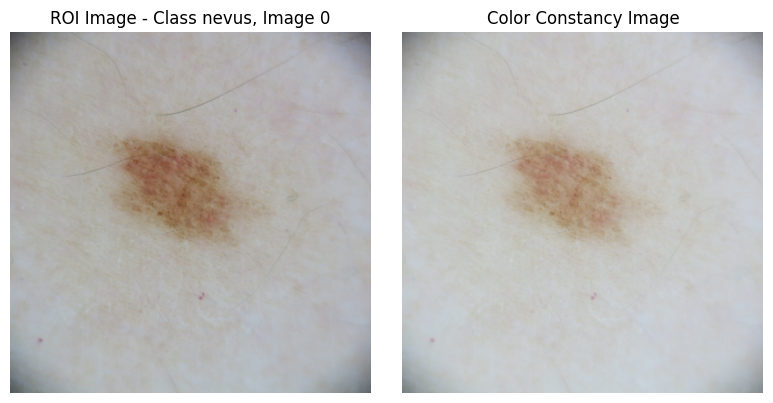

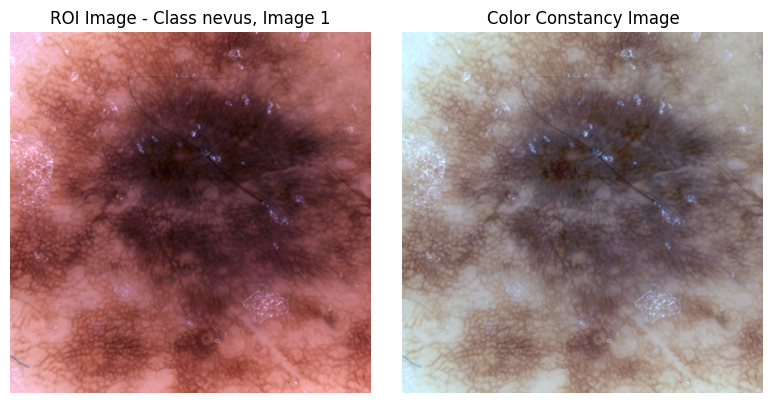

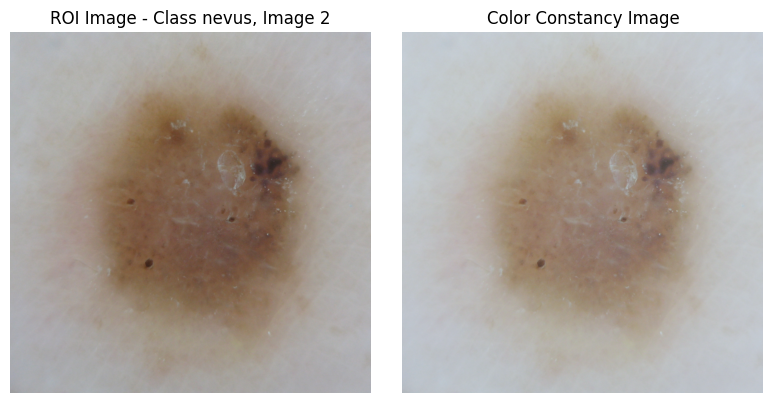

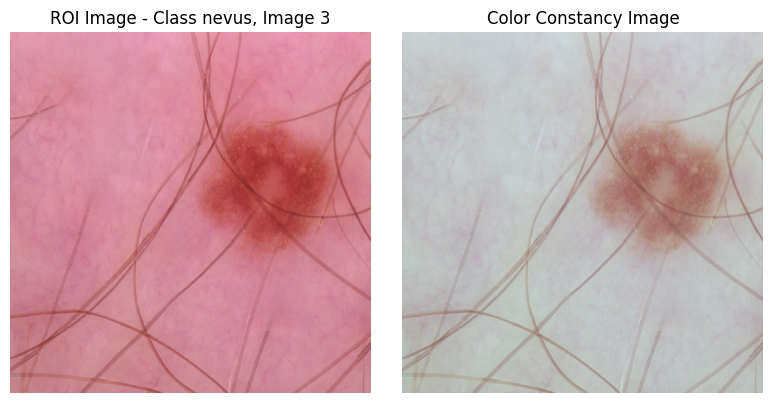

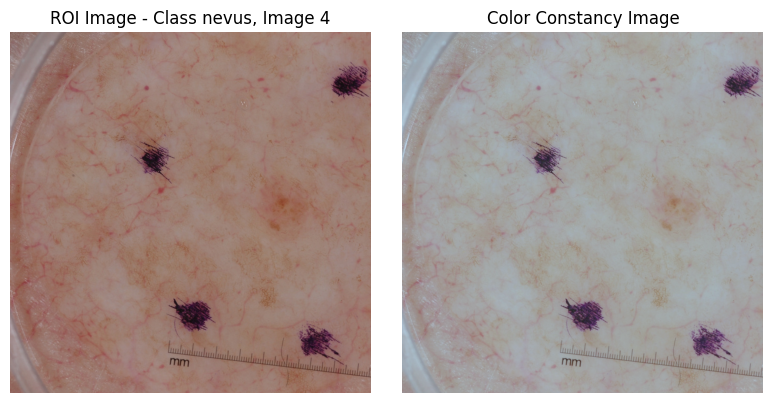

...

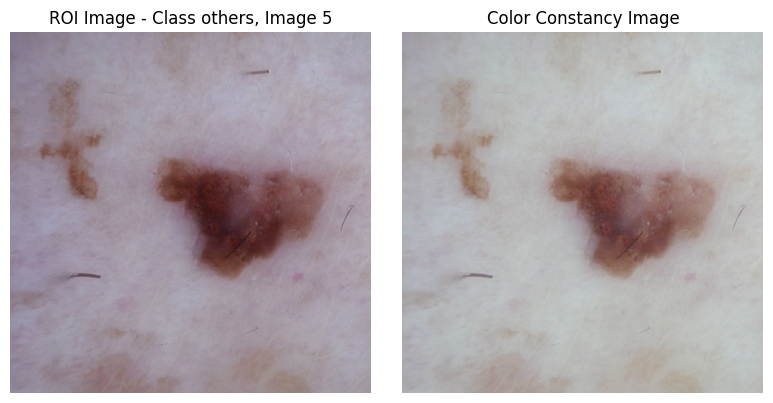

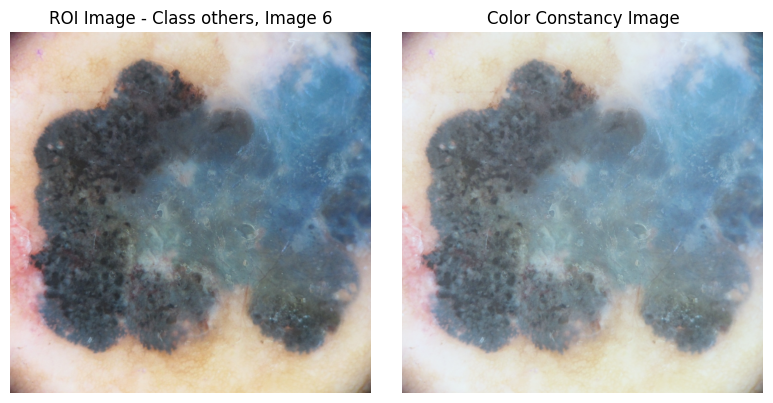

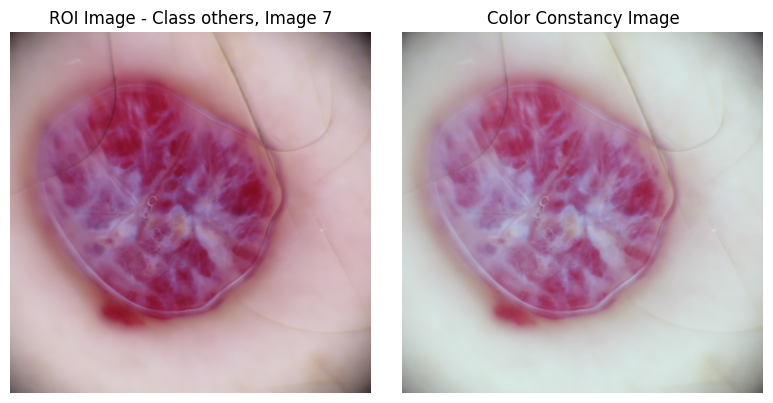

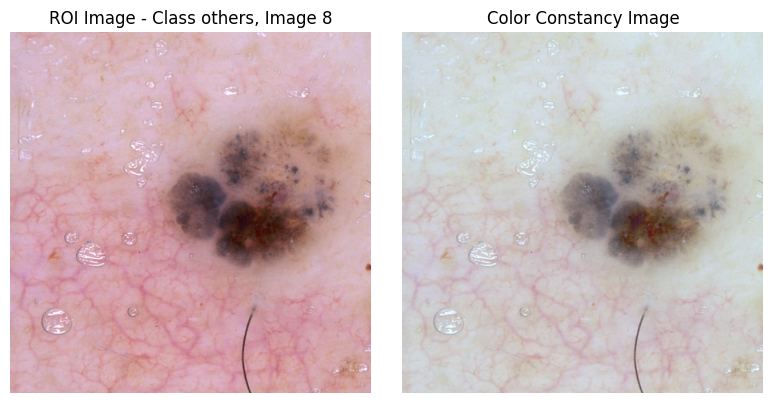

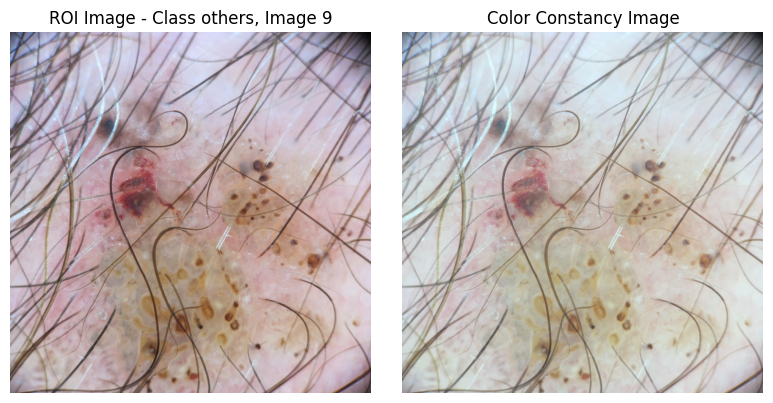

In [35]:
# # Loop through the images
# for class_idx, c in enumerate(selected_images.keys()):
#     for img_idx, img_path in enumerate(selected_images[c]):
#         # Load the image
#         img = cv2.imread(img_path)
#         img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#         # Image dimensions
#         h, w = img_rgb.shape[:2]

#         # Coordinates along the diagonal
#         diagonal_values = [np.mean(img_rgb[i, i, :]) for i in range(min(h, w))]

#         # Define a threshold to crop the image based on diagonal pixel intensities
#         threshold = 50

#         # Find the first and last points where the threshold is crossed
#         try:
#             first_cross = next(i for i, value in enumerate(diagonal_values) if value >= threshold)
#         except StopIteration:
#             first_cross = 0  # Default to zero if no value is found

#         try:
#             last_cross = len(diagonal_values) - next(i for i, value in enumerate(reversed(diagonal_values)) if value >= threshold)
#         except StopIteration:
#             last_cross = len(diagonal_values)  # Default to full length if no value is found

#         # Crop the image using the calculated coordinates
#         y1 = max(0, first_cross)
#         y2 = min(h, last_cross)
#         x1 = max(0, first_cross)
#         x2 = min(w, last_cross)

#         cropped_img = img_rgb[y1:y2, x1:x2, :]

#         # If the resulting image has zero height or width, keep the original
#         if cropped_img.shape[0] == 0 or cropped_img.shape[1] == 0:
#             cropped_img = img_rgb

#         # Gamma correction
#         img_dtype = cropped_img.dtype
#         gamma = 1.5  # Adjusted gamma value to reduce the washing-out effect
#         look_up_table = np.array([((i / 255.0) ** (1 / gamma)) * 255 for i in np.arange(0, 256)]).astype("uint8")
#         img_gamma_corrected = cv2.LUT(cropped_img.astype('uint8'), look_up_table)

#         # Convert image to float32 for further processing
#         img_float = img_gamma_corrected.astype('float32')

#         # Apply power law to enhance contrast
#         power = 6
#         img_power = np.power(img_float, power)

#         # Calculate the RGB normalization vector
#         rgb_vec = np.power(np.mean(img_power, axis=(0, 1)), 1 / power)

#         # Normalize the RGB vector (L2 normalization)
#         rgb_norm = np.sqrt(np.sum(np.power(rgb_vec, 2.0)))
#         rgb_vec /= rgb_norm

#         # Adjust the colors based on the normalization vector
#         scaling_factor = 1 / (rgb_vec * np.sqrt(3))
#         img_color_const = np.multiply(img_float, scaling_factor)

#         # Clip values to stay within valid range (0 to 255) and convert back to original data type
#         img_color_const = np.clip(img_color_const, 0, 255).astype(img_dtype)

#         # Display the ROI and Color Constancy images side by side
#         plt.figure(figsize=(8, 4))
#         plt.subplot(1, 2, 1)
#         plt.imshow(cropped_img)
#         plt.title(f"ROI Image - Class {c}, Image {img_idx}")
#         plt.axis("off")

#         plt.subplot(1, 2, 2)
#         plt.imshow(img_color_const)
#         plt.title("Color Constancy Image")
#         plt.axis("off")

#         plt.tight_layout()
#         plt.show()

In [10]:
# for class_idx, c in enumerate(selected_images.keys()):
#     for img_idx, img_path in enumerate(selected_images[c]):
#         img = cv2.imread(img_path)
#         img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#         # Apply Gaussian blur to reduce noise and smoothen soft edges
#         img_blurred = cv2.GaussianBlur(img_rgb, (7, 7), 0)

#         # Reshape the image to be a list of pixels
#         pixels = img_blurred.reshape((-1, 3))
#         pixels = np.float32(pixels)

#         # Define criteria and apply k-means
#         criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
#         k = 4  # Number of clusters, can be adjusted based on the image complexity
#         _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

#         # Convert centers to 8-bit values
#         centers = np.uint8(centers)

#         # Map labels to center colors
#         segmented_image = centers[labels.flatten()]
#         segmented_image = segmented_image.reshape(img_rgb.shape)

#         # Identify clusters likely to contain the lesion based on their average color intensity
#         mean_values = [np.mean(center) for center in centers]
#         # Choose clusters with a lower mean intensity as lesions are generally darker
#         lesion_cluster_idxs = [i for i, mean in enumerate(mean_values) if mean < np.percentile(mean_values, 50)]

#         # Create a mask to combine the lesion clusters
#         lesion_mask = np.isin(labels.flatten(), lesion_cluster_idxs).reshape((img_rgb.shape[:2])).astype(np.uint8) * 255

#         # Smooth the mask with a Gaussian filter to keep the soft edges
#         lesion_mask_smooth = cv2.GaussianBlur(lesion_mask, (15, 15), 0)

#         # Use the mask to extract the lesion from the original image
#         lesion_extracted = cv2.bitwise_and(img_rgb, img_rgb, mask=lesion_mask_smooth)

#         # Display the original, segmented, and extracted lesion
#         plt.figure(figsize=(18, 6))
#         plt.subplot(1, 3, 1)
#         plt.imshow(img_rgb)
#         plt.title("Original Image")
#         plt.axis('off')

#         plt.subplot(1, 3, 2)
#         plt.imshow(segmented_image)
#         plt.title("Segmented Image")
#         plt.axis('off')

#         plt.subplot(1, 3, 3)
#         plt.imshow(lesion_extracted)
#         plt.title("Extracted Lesion with Smooth Mask")
#         plt.axis('off')

#         plt.show()

In [29]:
# def generate_roi(img_path, threshold=50):
#     # Load and convert the image
#     img = cv2.imread(img_path)
#     img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#     # Image dimensions
#     h, w = img_rgb.shape[:2]

#     # Coordinates along the diagonal 
#     diagonal_values = [np.mean(img_rgb[i, i, :]) for i in range(min(h, w))]

#     # Find the first and last points where the threshold is crossed
    try:
#         first_cross = next(i for i, value in enumerate(diagonal_values) if value >= threshold)
#     except StopIteration:
#         first_cross = 0

#     try:
#         last_cross = len(diagonal_values) - next(i for i, value in enumerate(reversed(diagonal_values)) if value >= threshold)
#     except StopIteration:
#         last_cross = len(diagonal_values)

#     # Crop the image using the calculated coordinates
#     y1 = max(0, first_cross)
#     y2 = min(h, last_cross)
#     x1 = max(0, first_cross)
#     x2 = min(w, last_cross)

#     cropped_img = img_rgb[y1:y2, x1:x2, :]

#     # If the resulting image has zero height or width, keep the original
#     if cropped_img.shape[0] == 0 or cropped_img.shape[1] == 0:
#         cropped_img = img_rgb

#     return cropped_img

# def remove_hair(img):
#     gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#     kernel = cv2.getStructuringElement(1, (17, 17))
#     blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
#     _, hair_mask = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
#     inpainted_img = cv2.inpaint(img, hair_mask, 1, cv2.INPAINT_TELEA)
#     return inpainted_img

# def remove_black_borders(img):
#     gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#     _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY_INV)
#     contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#     contours = sorted(contours, key=cv2.contourArea, reverse=True)
#     if len(contours) > 0:
#         largest_contour = contours[0]
#         mask = np.ones_like(gray, dtype=np.uint8) * 255
#         cv2.drawContours(mask, [largest_contour], -1, 0, thickness=cv2.FILLED)
#         img_no_border = cv2.bitwise_and(img, img, mask=mask)
#         return img_no_border
#     return img

# def kmeans_segmentation(img, k=4):
#     pixels = img.reshape((-1, 3))
#     pixels = np.float32(pixels)
#     criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
#     _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
#     centers = np.uint8(centers)
#     segmented_image = centers[labels.flatten()].reshape(img.shape)

#     mean_values = [np.mean(center) for center in centers]
#     lesion_cluster_idxs = [i for i, mean in enumerate(mean_values) if mean < np.percentile(mean_values, 50)]
#     lesion_mask = np.isin(labels.flatten(), lesion_cluster_idxs).reshape((img.shape[:2])).astype(np.uint8) * 255

#     lesion_mask_smooth = cv2.GaussianBlur(lesion_mask, (15, 15), 0)
#     lesion_extracted = cv2.bitwise_and(img, img, mask=lesion_mask_smooth)

#     return lesion_extracted, segmented_image

# def process_image(img_path):
#     # Step 1: Generate ROI
#     roi_img = generate_roi(img_path)
    
#     # Step 2: Remove hair from ROI
#     hair_removed_img = remove_hair(roi_img)
    
#     # Step 3: Remove black borders
#     no_border_img = remove_black_borders(hair_removed_img)
    
#     # Step 4: Apply KMeans segmentation
#     lesion_extracted, segmented_image = kmeans_segmentation(no_border_img)

#     # Display the results
#     plt.figure(figsize=(15, 10))
#     plt.subplot(1, 4, 1)
#     plt.imshow(roi_img)
#     plt.title("ROI Image")
#     plt.axis("off")
    
#     plt.subplot(1, 4, 2)
#     plt.imshow(hair_removed_img)
#     plt.title("Hair Removed Image")
#     plt.axis("off")
    
#     plt.subplot(1, 4, 3)
#     plt.imshow(no_border_img)
#     plt.title("No Border Image")
#     plt.axis("off")
    
#     plt.subplot(1, 4, 4)
#     plt.imshow(lesion_extracted)
#     plt.title("Lesion Extracted")
#     plt.axis("off")
    
#     plt.show()

# # Example usage
# # process_image('path_to_image.jpg') # Replace 'path_to_image.jpg' with actual image path


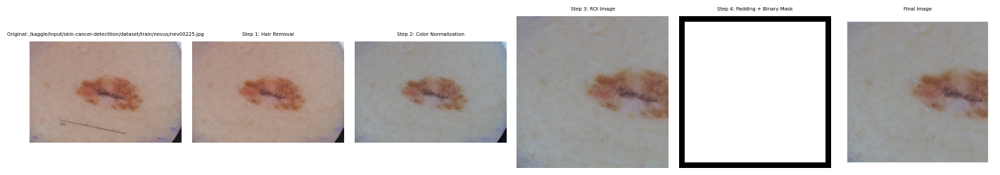

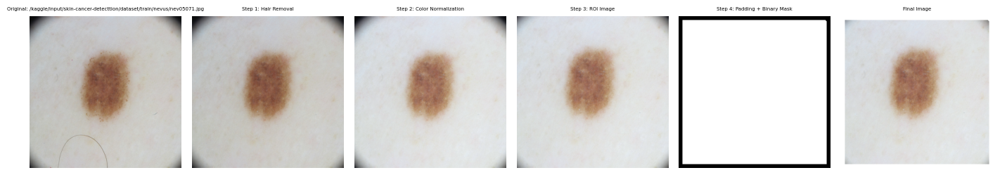

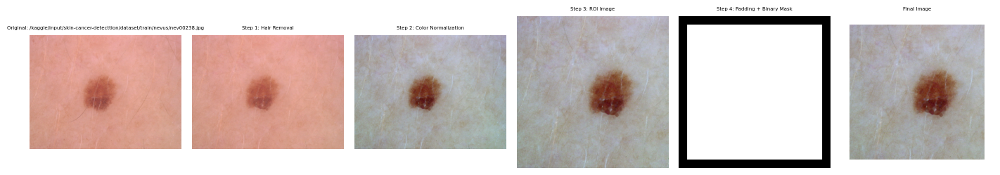

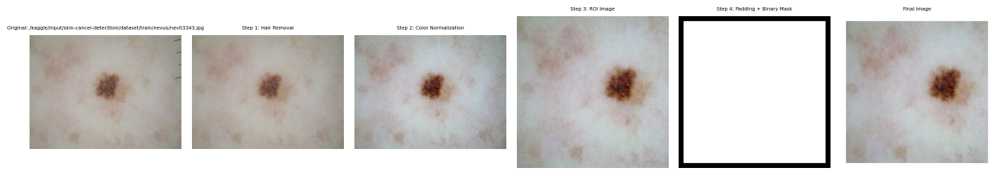

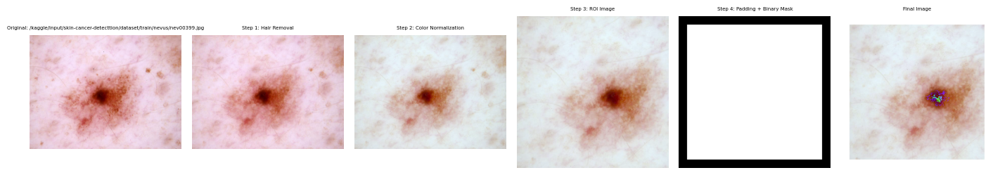

...

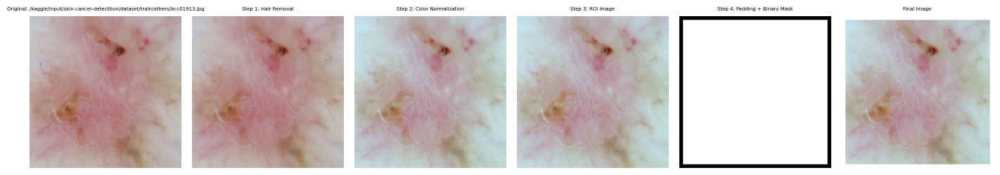

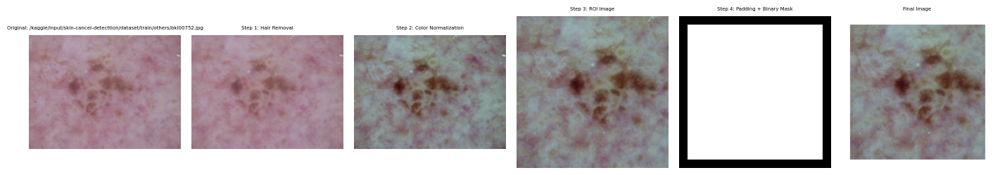

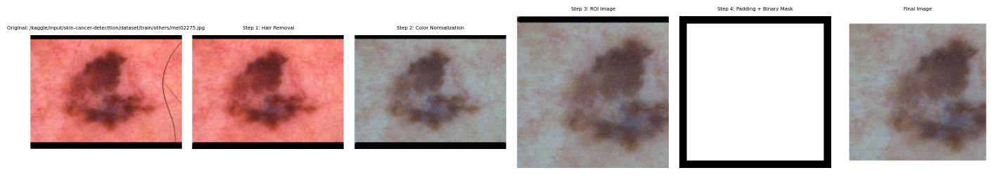

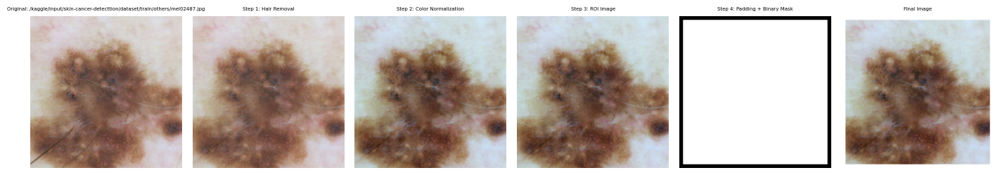

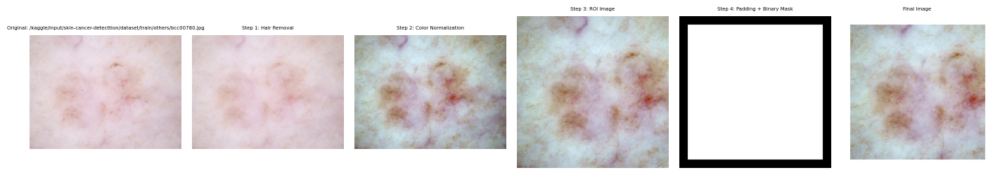

In [73]:
# Use Preprocessing class 

preprocessing = Preprocessing()

for class_idx, c in enumerate(selected_images.keys()):
    for img_idx, img_path in enumerate(selected_images[c]):
        img = cv2.imread(img_path)
        preprocessing.preprocess_image(img, img_path, True)

In [79]:
class FeatureExtraction:
  """
    FeatureExtraction class. This class's purpose is to extract the features from the image.
  """

  def variegation(self,Im: np.ndarray):
    # Split Color channels
    lesion_r, lesion_g, lesion_b = np.split(Im, 3, axis=2)

    # Compute the normalized Standard Deviation of each channel
    C_r = np.std(lesion_r) / np.max(lesion_r)
    C_g = np.std(lesion_g) / np.max(lesion_g)
    C_b = np.std(lesion_b) / np.max(lesion_b)

    variegation = np.array([C_r, C_g, C_b]).reshape(1, -1)
    return variegation

  # Color Features
  def color_moments(self,Img: np.ndarray):

    c1, c2, c3 = cv.split(Img)
    color_feature = []  # Initialize the color feature

    # -- The first central moment - average
    c1_mean, c2_mean, c3_mean = np.mean(c1), np.mean(c2), np.mean(c3)
    color_feature.extend([c1_mean, c2_mean, c3_mean])

    # -- The second central moment - standard deviation
    c1_std, c2_std, c3_std = np.std(c1), np.std(c2), np.std(c3)
    color_feature.extend([c1_std, c2_std, c3_std])

    # -- The third central moment - the third root of the skewness
    c1_skewness = np.mean(np.abs(c1 - c1_mean) ** 3)
    c2_skewness = np.mean(np.abs(c2 - c2_mean) ** 3)
    c3_skewness = np.mean(np.abs(c3 - c3_mean) ** 3)
    c1_thirdMoment, c2_thirdMoment, c3_thirdMoment = c1_skewness ** (1. / 3), c2_skewness ** (1. / 3), c3_skewness ** (1. / 3)
    color_feature.extend([c1_thirdMoment, c2_thirdMoment, c3_thirdMoment])

    # -- The fourth central moment - the variance
    c1_var, c2_var, c3_var = c1_std ** 2, c2_std ** 2, c3_std ** 2
    color_feature.extend([c1_var, c2_var, c3_var])

    return np.array(color_feature).reshape(1, -1)

  # Color Histogram Features
  def calculate_normalized_histogram(self,channel, n_bins):
    hist = cv.calcHist([channel], [0], None, [n_bins], [1, 256])
    hist = hist / hist.sum()
    return hist

  def color_histogram(self,Img: np.ndarray, n_bins: int = 256):
    rgb_channels = cv.split(Img)
    hsv_image = cv.cvtColor(Img, cv.COLOR_RGB2HSV)
    hsv_channels = cv.split(hsv_image)
    lab_image = cv.cvtColor(Img, cv.COLOR_RGB2LAB)
    lab_channels = cv.split(lab_image)

    rgb_hist = np.concatenate([self.calculate_normalized_histogram(channel, n_bins) for channel in rgb_channels])
    hsv_hist = np.concatenate([self.calculate_normalized_histogram(channel, n_bins) for channel in hsv_channels])
    lab_hist = np.concatenate([self.calculate_normalized_histogram(channel, n_bins) for channel in lab_channels])

    return rgb_hist.reshape(1, -1), hsv_hist.reshape(1, -1), lab_hist.reshape(1, -1)

  # Texture Features
  def extract_lbp_feature(self,Img: np.ndarray, P: int = 16, R: int = 2):
    blue_Img = Img[:, :, 2]  # Use the blue channel of the Image
    lbp = local_binary_pattern(blue_Img, P, R, method='uniform')
    n_bins = int(lbp.max() + 1)
    lbp_fd, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
    lbp_fd = np.array(lbp_fd).reshape(1, -1)
    return lbp_fd

  def extract_haralick_feature(self,Img: np.ndarray):
    blue_Img = Img[:, :, 2]  # Use the blue channel of the Image
    haralick_fd = mahotas.features.haralick(blue_Img).mean(axis=0)
    haralick_fd = np.array(haralick_fd).reshape(1, -1)
    return haralick_fd

  def extract_glcm_feature(self,Img: np.ndarray):
    blue_Img = Img[:, :, 2]  # Use the blue channel of the Image
    distance = [1]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    properties = ['correlation', 'homogeneity', 'contrast', 'energy', 'dissimilarity']
    glcm_fd = []
    glcm_mat = graycomatrix(blue_Img, distances=distance, angles=angles, symmetric=True, normed=True)
    glcm_fd = np.hstack([graycoprops(glcm_mat, props).ravel() for props in properties])
    glcm_fd = np.array(glcm_fd).reshape(1, -1)
    return glcm_fd

  def extract_texture_features(self,Img: np.ndarray, P, R):
    lbp_fd = self.extract_lbp_feature(Img, P, R)
    haralick_fd = self.extract_haralick_feature(Img)
    glcm_fd = self.extract_glcm_feature(Img)
    return lbp_fd, haralick_fd, glcm_fd

  def feature_normalization(self,features):
      # Initialize the MinMaxScaler
      scaler = MinMaxScaler()
      features.columns = features.columns.astype(str)
      features_norm = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)
      return features_norm

  def extract_all(self,image):

      # Initialize an empty DataFrame to store the features
      feature_df = pd.DataFrame()
      variegation_features = self.variegation(image)
      color_moments_features = self.color_moments(image)
      rgb_histogram, hsv_histogram, lab_histogram = self.color_histogram(image, 64)
      lbp_feature = self.extract_lbp_feature(image, 16, 2)
      haralick_feature = self.extract_haralick_feature(image)
      glcm_features = self.extract_glcm_feature(image)

      # Concatenate features into a single feature vector
      features = np.concatenate([
          variegation_features, color_moments_features, rgb_histogram, hsv_histogram, lab_histogram, lbp_feature,
          haralick_feature, glcm_features
      ], axis=1)

      # Create a DataFrame for the current image's features
      image_feature_df = pd.DataFrame(features)

      return image_feature_df




In [ ]:
class Utils:
    def __init__(self,type_training='Binary',img_path=None,img_size=(256,256)):
        """
        Utility class with various methods for dataset reading, feature extraction, normalization, and more.

        Args:
            type_training (str): Type of training (e.g., "Binary", "Multiclass"). Determines the training approach.
            img_path (str): Path to the image directory.
            img_size (tuple): Size of the images to be used.
        """
        self.preprocessing = Preprocessing()
        self.features = FeatureExtraction()
        self.type_training =type_training
        self.img_path=img_path
        self.img_size=img_size

# Function to read the dataset
    def read_dataset(self,subset):
        # Initialize vectors
        vec_img = []
        vec_labels = []
        path_images = os.path.join(self.img_path, subset) # Define the path to the dataset
        if self.type_training=='Binary':
            label_to_number = {'nevus': 0, 'others': 1}  # Define label-to-number mapping
        else:
            label_to_number = {'mel': 0, 'bcc': 1,'scc':2 } # Define label-to-number mapping

        for label, label_number in label_to_number.items():
            images_path = os.path.join(path_images, label)
            image_files = os.listdir(images_path)

            with tqdm(total=len(image_files), desc=f'Reading images {subset} ({label})...') as pbar:  # Initialize the progress bar
                for file_name in image_files:
                    image = os.path.join(images_path, file_name)
                    img = cv.imread(image)
                    if img is None:
                        print(f"Error loading image  {file_name}")
                    else:
                        resized_img = cv.resize(img, self.img_size)
                        vec_img.append(resized_img)
                        vec_labels.append(label_number)
                        pbar.update(1)  # Update the progress bar

        return np.asarray(vec_img), np.asarray(vec_labels)

    # Read test dataset
    def read_test_dataset(self,subset):
        # Initialize vectors
        vec_img = []
        path_images = os.path.join(self.img_path, subset) # Define the path to the dataset
        image_files = os.listdir(path_images)
        # Sort filenames based on numeric values
        image_files=sorted([f for f in image_files if f.endswith('.jpg')])
        with tqdm(total=len(image_files), desc=f'Reading images {subset} ') as pbar:  # Initialize the progress bar
            for file_name in image_files:
                image = os.path.join(path_images, file_name)
                img = cv.imread(image)
                if img is None:
                    print(f"Error loading image  {file_name}")
                else:
                    img=self.preprocessing.preprocess_image_ROI(img)
                    resized_img = cv.resize(img, self.img_size)
                    vec_img.append(resized_img)
                    pbar.update(1)  # Update the progress bar

        return np.asarray(vec_img)

    # Function to modify the column headings
    def column_headings(self):
        # Define feature category names and counts
        feature_categories = {
            "variegation_features": 3,
            "color_moments_features": 12,
            "rgb_histogram": 192,
            "hsv_histogram": 192,
            "lab_histogram": 192,
            "lbp_feature": 18,
            "haralick_feature": 13,
            "glcm_features": 20
        }

        # Generate column headings for each feature category
        column_headings_ = []
        for category, count in feature_categories.items():
            column_headings_.extend([f"{category} {i + 1}" for i in range(count)])

        return column_headings_

    # Function to normalise features
    def normalise_features(self, vec_features, vec_gt=None):
        # We normalize the data using min-max normalization
        if vec_gt is None:
            normalized_features = (vec_features - self.min_val) / (self.max_val - self.min_val)
            return normalized_features
        else:
            self.min_val = vec_features.min()
            self.max_val = vec_features.max()
            normalized_features = (vec_features - self.min_val) / (self.max_val - self.min_val)
            normalized_features.fillna(0, inplace=True)  # This will replace all NaNs with 0
            # Shuffle the rows
            normalized_features = normalized_features.sample(frac=1, random_state=0)
            normalized_features = normalized_features.reset_index(drop=True)
            vec_gt = pd.Series(vec_gt).sample(frac=1, random_state=0)
            vec_gt = vec_gt.reset_index(drop=True)

            return normalized_features, vec_gt


    # Function to extract features
    def extract_features(self,vec_img,subset=None):
        vec_features = []
        vec_gt = []

        with tqdm(total=len(vec_img), desc=f'{subset}: Extracting features... ') as pbar:  # Initialize the progress bar
            for i in range(len(vec_img)):
                vec_features.append(self.features.extract_all(vec_img[i]))
                pbar.update(1)  # Update the progress bar

        vec_features = pd.concat(vec_features)

        # Set meaningful column headings
        vec_features.columns = self.column_headings()
        return vec_features

    # Function to read and extract features
    def load_and_extract_features(self, subset):
        # Read the dataset
        data, data_gt = self.read_dataset(subset=subset)
        print(f"\n{subset} set: {data.shape[0]} images")

        # Extract features from the dataset
        vec_features = self.extract_features(data, subset=subset)

        # Normalise features
        vec_features, vec_gt = self.normalise_features(vec_features, data_gt)

        return vec_features, vec_gt

    # Function to read and extract features of the test set
    def load_and_extract_features_test(self, subset):
        # Read the dataset
        data = self.read_test_dataset(subset=subset)
        print(f"\n{subset} set: {data.shape[0]} images")

        # Extract features from the dataset
        vec_features = self.extract_features(data, subset=subset)

        # Normalise features
        vec_features = self.normalise_features(vec_features)

        return vec_features

    # Function to save features
    def save_features_to_csv(self,features, subset, base_path,ground_truth=None):
        # Save features
        if ground_truth is not None:
              pd.Series(ground_truth).to_csv(f'{base_path}/gt_features_{subset}_{self.img_size[0]}x{self.img_size[1]}.csv', index=False)
        features.to_csv(f'{base_path}/featu